In [101]:
import yaml
import torch
from IMPA.dataset.data_loader import CellDataLoader
from IMPA.solver import IMPAmodule
import pandas as pd
from omegaconf import OmegaConf
import scanpy as sc
import seaborn as sns

import numpy as np
import IMPA.featurizer.vision_transformer as vits
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
import pickle as pkl

**Plotting function**

In [102]:
def pca_umap_plot_with_preprocessing(adata, title, batch_name):
    sc.settings.figdir = "/home/icb/alessandro.palma/environment/IMPA/IMPA/notebooks/cpg0000/corrections_old_paper/plots/"

    # Set a random seed for reproducibility
    np.random.seed(0)

    # Randomly permute the indices
    random_indices = np.random.permutation(list(range(adata.shape[0])))

    # Set a color palette for better color representation
    sns.set_palette("colorblind")

    # Plot the PCA with random reordering
    sc.pl.pca(adata[random_indices, :], color=batch_name, title=title, s=30)

    # Plot the UMAP with random reordering
    sc.pl.umap(adata[random_indices, :], color=batch_name, title=title, s=30)

    # Show the plots
    plt.show()

**Code**

In [103]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

From https://github.com/broadinstitute/DINO4Cells_code

In [104]:
path_to_config = "/home/icb/alessandro.palma/environment/IMPA/IMPA/configs/config_dino.yaml"
config = yaml.safe_load(open(path_to_config, "r"))

In [105]:
ckpt_path = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/Cell_Painting_data/DINO_cell_painting_base_checkpoint.pth"

In [106]:
state_dict = torch.load(ckpt_path)

In [107]:
torch.cuda.is_available()

True

**Load model weights**

In [108]:
config["model"]["arch"] = 'vit_base'

In [109]:
model = vits.__dict__[config["model"]["arch"]](
                img_size=[128],
                patch_size=16,
                in_chans=5
            )

embed_dim = model.embed_dim

In [110]:
config["embedding"]["HEAD"] = (
        True if "HEAD" in list(config["embedding"].keys()) else False
    )

In [111]:
embed_dim

768

In [112]:
for p in model.parameters():
    p.requires_grad = False

In [113]:
model.eval()
model.to(device)

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(5, 768, kernel_size=(16, 16), stride=(16, 16))
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (blocks): ModuleList(
    (0-11): 12 x Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
    )
  )
  (norm): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
  (head): Identity()
)

In [114]:
# pretrained_weights = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/Cell_Painting_data/DINO_cell_painting_small_checkpoint.pth"
pretrained_weights = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/Cell_Painting_data/DINO_cell_painting_base_checkpoint.pth"

In [115]:
state_dict = torch.load(pretrained_weights)

In [116]:
if "teacher" in state_dict:
    teacher = state_dict["teacher"]
    if not config["embedding"]["HEAD"] == True:
        teacher = {k.replace("module.", ""): v for k, v in teacher.items()}
        teacher = {
            k.replace("backbone.", ""): v for k, v in teacher.items()
        }
    msg = model.load_state_dict(teacher, strict=False)
else:
    student = state_dict
    if not config["embedding"]["HEAD"] == True:
        student = {k.replace("module.", ""): v for k, v in student.items()}
        student = {
            k.replace("backbone.", ""): v for k, v in student.items()
        }
    student = {k.replace("0.", ""): v for k, v in student.items()}
    msg = model.load_state_dict(student, strict=False)

**Featurize RxRx1 before and after batchn transformation**

In [117]:
args = {
    # TASK NAME
    'task_name': 'rxrx1_batch',

    # IMAGE
    'img_size': 96,
    'latent_dim': 100,
    'hidden_dim': 512,
    'style_dim': 64,
    'stochastic': False,
    'z_dimension': 10,
    'dim_in': 64,
    'pert_modelling': False,
    'batch_key': 'BATCH',
    'subsample_frac': 1.0,

    # LOSS
    'lambda_reg': 1,
    'lambda_cyc': 1,
    'lambda_sty': 1,
    'lambda_ds': 1,

    # TRAINING
    'total_epochs': 100,
    'ds_iter': 100000,
    'resume_iter': 0,
    'batch_size': 32,
    'val_batch_size': 20,
    'lr': 0.0001,
    'f_lr': 0.0001,
    'beta1': 0,
    'beta2': 0.99,
    'weight_decay': 0.0001,
    'num_outs_per_domain': 10,
    'single_style': True,
    'ood_set': None,
    'mol_list': None,
    'balanced': False,
    'trainable_emb': True,
    'dataset_name': 'rxrx1',
    'n_channels': 6,
    'num_workers': 6,
    'seed': 42,

    # DIRECTORIES FOR DATA
    'image_path': '/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1',
    'data_index_path': '/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1/metadata/rxrx1_df.csv',
    'embedding_path': None,

    # DIRECTORIES FOR RESULTS
    'experiment_directory': '../project_folder/experiments/',
    'sample_dir': 'sample',
    'checkpoint_dir': 'checkpoint',
    'basal_vs_real_folder': 'basal_vs_real',
    'naming_key': 'dataset_name',
    'embedding_folder': 'embeddings',
    'resume_dir': '',

    # DATA HANDLEMENT
    'augment_train': True,
    'normalize': True,

    # LOGGING INFO
    'print_every': 10,
    'sample_every': 1000,
    'save_every': 500,
    'eval_every': 500,

    # PARAMETERS FOR CONDITION ENCODING
    'encode_rdkit': True,
    'num_layers_mapping_net': 1,

    # Lightning
    'filename': 'epoch_{epoch:04d}',
    'monitor': 'fid_transformations',
    'mode': 'min',
    'save_last': True,
    'offline': False,
    'project': 'rxrx1_batch',
    'log_model': False,
    'accelerator': 'gpu',
    'log_every_n_steps': 10
}
args = OmegaConf.create(args)

In [118]:
dataloader = CellDataLoader(args)

In [119]:
dest_dir = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/experiments/20240305_108d75a0-a0ff-43f4-ad5d-196aebb2b1dc_rxrx1_batch"

In [120]:
solver = IMPAmodule(args, dest_dir, dataloader)
solver._load_checkpoint(13)

Number of parameters in generator: 24320518
Number of parameters in style_encoder: 14331200
Number of parameters in discriminator: 14299907
Number of parameters in mapping_network: 6464
Initializing embedding_matrix...
Initializing generator...
Initializing style_encoder...
Initializing discriminator...
Initializing mapping_network...
Loading checkpoint from /home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/experiments/20240305_108d75a0-a0ff-43f4-ad5d-196aebb2b1dc_rxrx1_batch/checkpoint/000013_nets.ckpt...
/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/experiments/20240305_108d75a0-a0ff-43f4-ad5d-196aebb2b1dc_rxrx1_batch/checkpoint/000013_nets.ckpt
Loading checkpoint from /home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/experiments/20240305_108d75a0-a0ff-43f4-ad5d-196aebb2b1dc_rxrx1_batch/checkpoint/000013_embeddings.ckpt...
/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/experiments/20240305_108d75a0-a0ff-43f4-ad5d-196aebb2

In [121]:
train_dataloader = dataloader.train_dataloader()
val_dataloader = dataloader.val_dataloader()

  0%|          | 0/4272 [00:00<?, ?it/s]

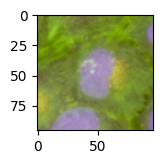

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


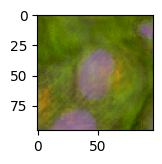

  0%|          | 1/4272 [00:02<3:03:12,  2.57s/it]

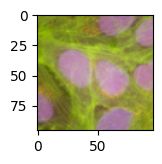

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


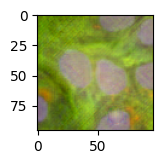

  0%|          | 2/4272 [00:02<1:30:47,  1.28s/it]

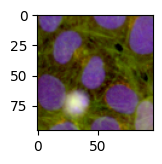

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


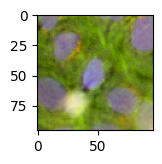

  0%|          | 3/4272 [00:03<59:20,  1.20it/s]  Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


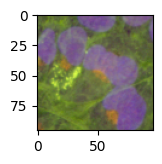

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


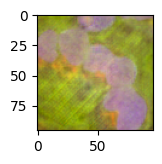

  0%|          | 4/4272 [00:03<44:23,  1.60it/s]

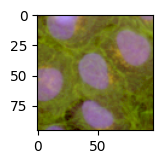

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


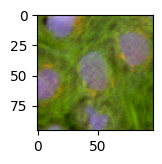

  0%|          | 5/4272 [00:03<35:54,  1.98it/s]

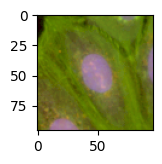

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


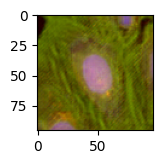

  0%|          | 6/4272 [00:04<31:09,  2.28it/s]

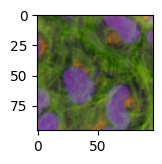

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


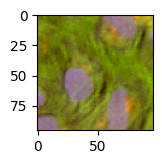

  0%|          | 7/4272 [00:04<27:56,  2.54it/s]

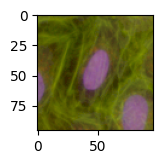

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


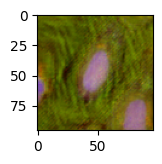

  0%|          | 8/4272 [00:04<25:57,  2.74it/s]

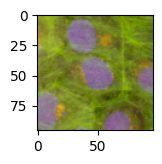

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


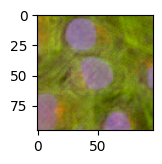

  0%|          | 9/4272 [00:05<24:29,  2.90it/s]

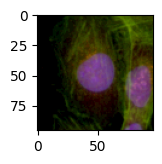

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


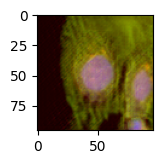

  0%|          | 10/4272 [00:05<23:20,  3.04it/s]

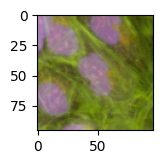

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


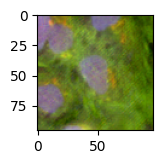

  0%|          | 11/4272 [00:05<22:29,  3.16it/s]

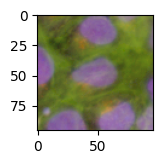

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


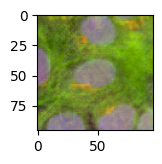

  0%|          | 12/4272 [00:05<22:01,  3.22it/s]

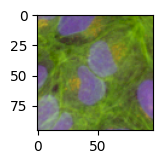

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


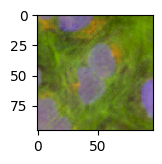

  0%|          | 13/4272 [00:06<21:58,  3.23it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


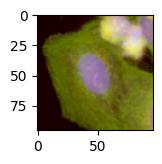

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


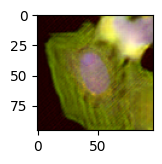

  0%|          | 14/4272 [00:06<21:47,  3.26it/s]

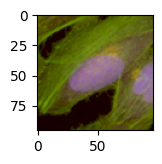

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


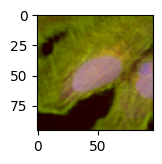

  0%|          | 15/4272 [00:06<21:25,  3.31it/s]

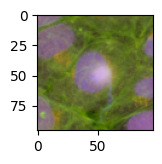

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


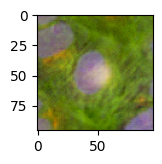

  0%|          | 16/4272 [00:07<21:11,  3.35it/s]

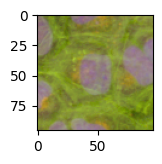

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


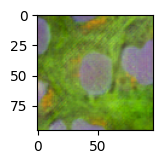

  0%|          | 17/4272 [00:07<21:11,  3.35it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


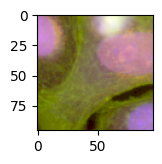

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


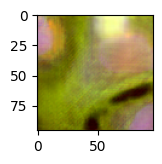

  0%|          | 18/4272 [00:07<21:05,  3.36it/s]

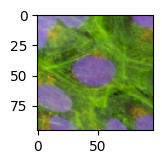

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


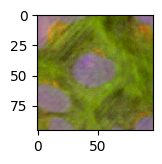

  0%|          | 19/4272 [00:08<21:18,  3.33it/s]

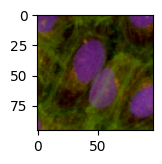

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


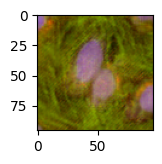

  0%|          | 20/4272 [00:08<21:32,  3.29it/s]

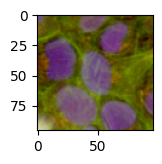

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


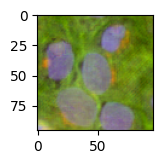

  0%|          | 21/4272 [00:08<21:36,  3.28it/s]

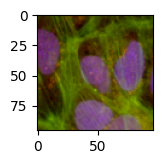

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


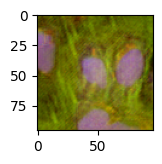

  1%|          | 22/4272 [00:08<21:30,  3.29it/s]

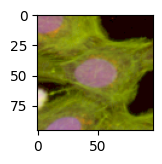

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


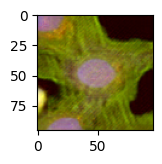

  1%|          | 23/4272 [00:09<21:19,  3.32it/s]

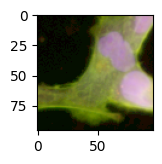

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


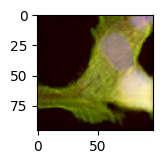

  1%|          | 24/4272 [00:09<20:48,  3.40it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


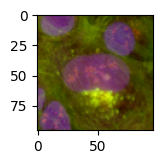

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


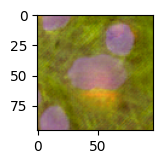

  1%|          | 25/4272 [00:09<21:05,  3.36it/s]

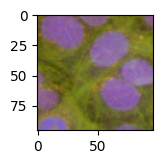

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


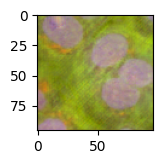

  1%|          | 26/4272 [00:10<21:05,  3.35it/s]

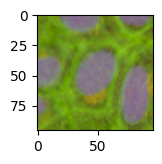

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


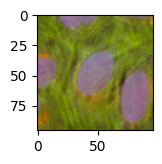

  1%|          | 27/4272 [00:10<21:05,  3.35it/s]

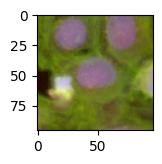

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


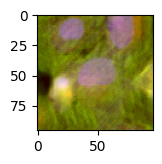

  1%|          | 28/4272 [00:10<21:03,  3.36it/s]

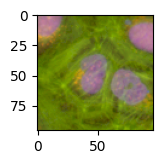

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


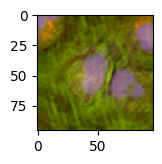

  1%|          | 29/4272 [00:11<20:45,  3.41it/s]

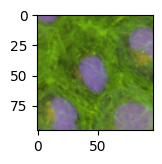

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


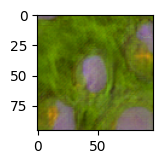

  1%|          | 30/4272 [00:11<20:21,  3.47it/s]

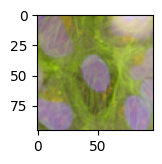

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


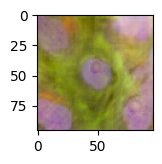

  1%|          | 31/4272 [00:11<20:45,  3.41it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


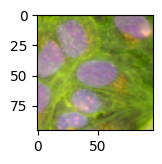

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


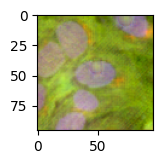

  1%|          | 32/4272 [00:11<20:04,  3.52it/s]

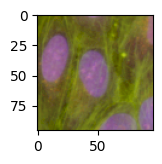

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


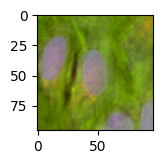

  1%|          | 33/4272 [00:12<19:54,  3.55it/s]

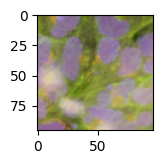

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


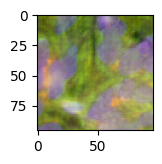

  1%|          | 34/4272 [00:12<19:35,  3.61it/s]

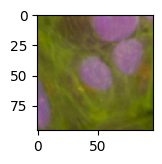

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


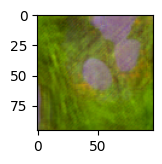

  1%|          | 35/4272 [00:12<22:06,  3.19it/s]

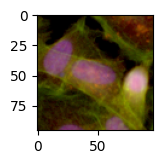

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


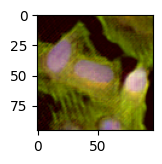

  1%|          | 36/4272 [00:13<22:00,  3.21it/s]

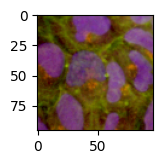

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


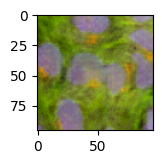

  1%|          | 37/4272 [00:13<21:41,  3.25it/s]

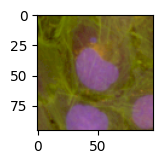

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


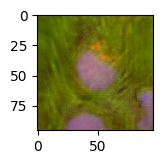

  1%|          | 38/4272 [00:13<20:37,  3.42it/s]

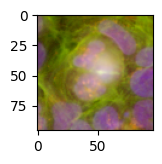

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


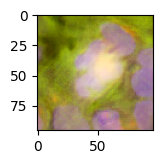

  1%|          | 39/4272 [00:13<20:06,  3.51it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


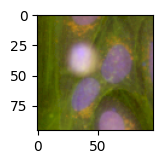

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


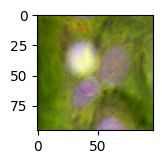

  1%|          | 40/4272 [00:14<19:00,  3.71it/s]

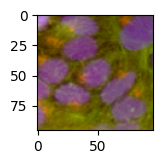

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


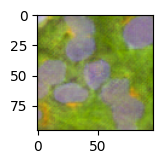

  1%|          | 41/4272 [00:14<18:21,  3.84it/s]

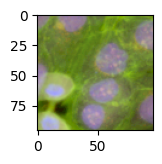

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


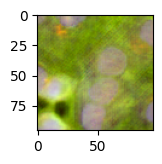

  1%|          | 42/4272 [00:14<17:48,  3.96it/s]

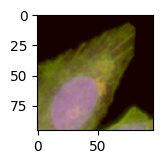

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


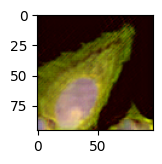

  1%|          | 43/4272 [00:14<17:28,  4.04it/s]

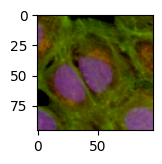

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


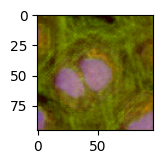

  1%|          | 44/4272 [00:15<17:17,  4.07it/s]

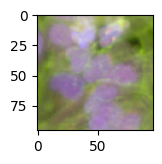

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


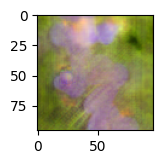

  1%|          | 45/4272 [00:15<17:11,  4.10it/s]

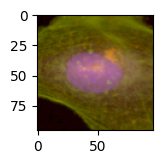

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


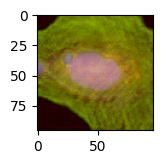

  1%|          | 46/4272 [00:15<17:03,  4.13it/s]

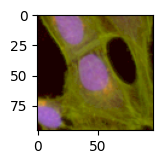

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


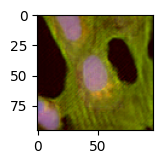

  1%|          | 47/4272 [00:15<16:55,  4.16it/s]

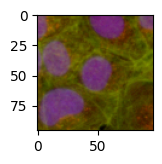

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


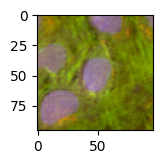

  1%|          | 48/4272 [00:16<16:45,  4.20it/s]

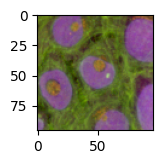

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


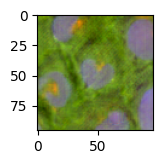

  1%|          | 49/4272 [00:16<16:41,  4.21it/s]

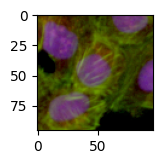

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


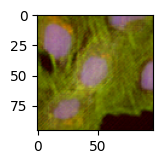

  1%|          | 50/4272 [00:16<16:41,  4.22it/s]

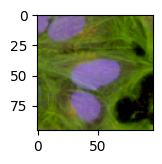

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


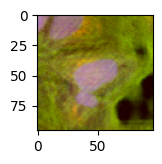

  1%|          | 51/4272 [00:16<16:42,  4.21it/s]

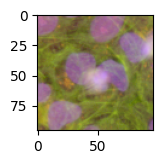

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


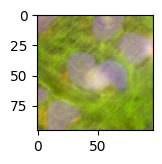

  1%|          | 52/4272 [00:16<16:38,  4.23it/s]

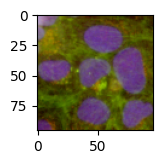

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


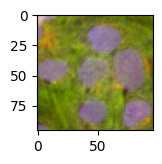

  1%|          | 53/4272 [00:17<16:34,  4.24it/s]

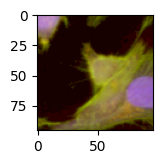

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


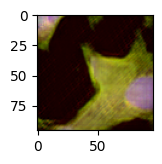

  1%|▏         | 54/4272 [00:17<16:35,  4.24it/s]

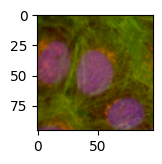

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


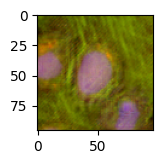

  1%|▏         | 55/4272 [00:17<16:37,  4.23it/s]

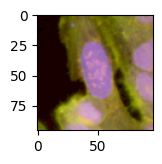

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


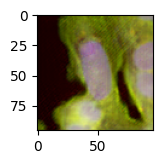

  1%|▏         | 56/4272 [00:17<16:49,  4.18it/s]

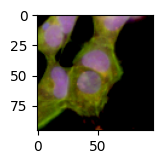

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


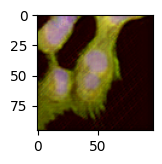

  1%|▏         | 57/4272 [00:18<16:42,  4.21it/s]

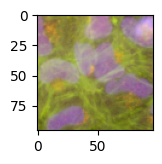

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


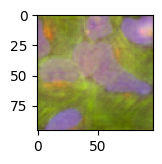

  1%|▏         | 58/4272 [00:18<16:40,  4.21it/s]

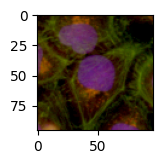

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


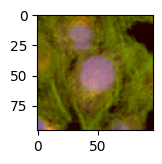

  1%|▏         | 59/4272 [00:18<16:41,  4.20it/s]

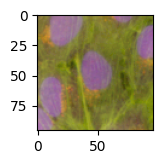

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


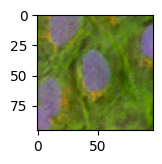

  1%|▏         | 60/4272 [00:18<16:33,  4.24it/s]

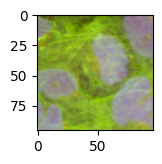

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


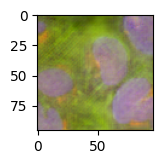

  1%|▏         | 61/4272 [00:19<16:41,  4.20it/s]

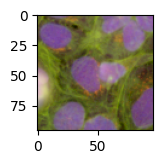

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


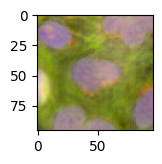

  1%|▏         | 62/4272 [00:19<16:45,  4.19it/s]

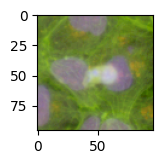

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


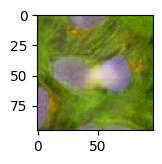

  1%|▏         | 63/4272 [00:19<16:50,  4.16it/s]

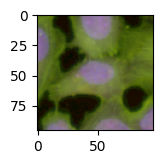

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


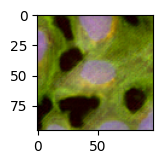

  1%|▏         | 64/4272 [00:19<16:37,  4.22it/s]

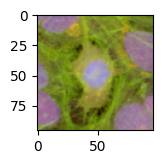

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


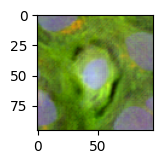

  2%|▏         | 65/4272 [00:20<18:00,  3.89it/s]

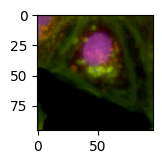

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


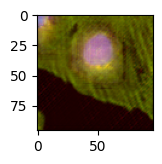

  2%|▏         | 66/4272 [00:20<18:19,  3.83it/s]

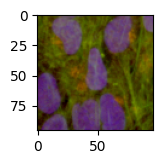

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


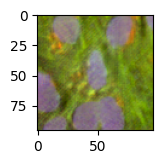

  2%|▏         | 67/4272 [00:20<19:09,  3.66it/s]

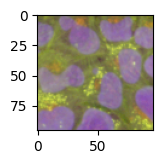

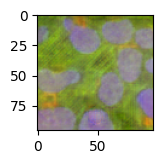

  2%|▏         | 68/4272 [00:20<18:39,  3.75it/s]

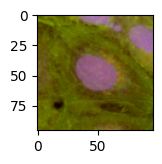

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


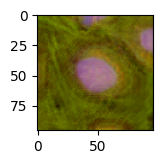

  2%|▏         | 69/4272 [00:21<18:05,  3.87it/s]

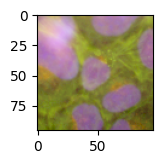

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


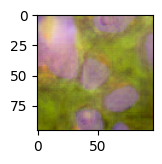

  2%|▏         | 70/4272 [00:21<17:36,  3.98it/s]

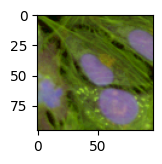

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


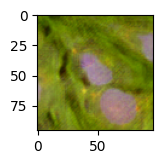

  2%|▏         | 71/4272 [00:21<17:16,  4.05it/s]

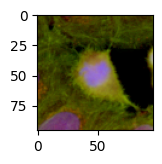

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


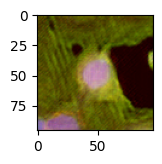

  2%|▏         | 72/4272 [00:21<16:50,  4.16it/s]

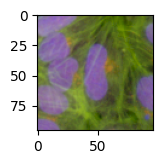

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


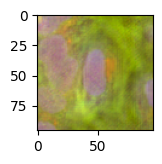

  2%|▏         | 73/4272 [00:22<16:41,  4.19it/s]

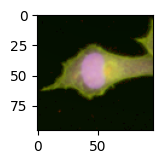

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


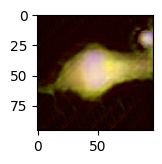

  2%|▏         | 74/4272 [00:22<17:47,  3.93it/s]

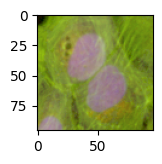

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


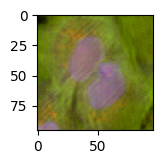

  2%|▏         | 75/4272 [00:22<18:21,  3.81it/s]

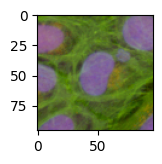

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


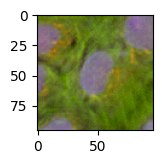

  2%|▏         | 76/4272 [00:22<18:46,  3.72it/s]

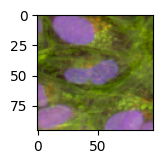

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


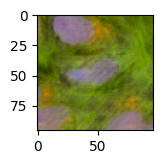

  2%|▏         | 77/4272 [00:23<18:19,  3.82it/s]

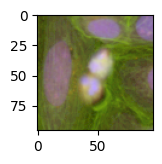

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


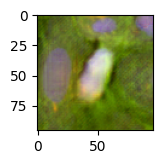

  2%|▏         | 78/4272 [00:23<17:57,  3.89it/s]

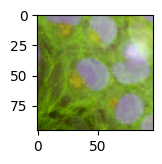

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


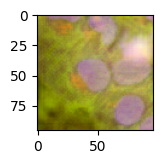

  2%|▏         | 79/4272 [00:23<17:35,  3.97it/s]

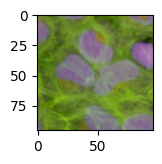

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


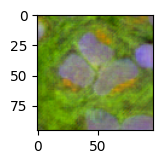

  2%|▏         | 80/4272 [00:23<17:15,  4.05it/s]Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/multiprocessing/queues.py", line 239, in _feed
    reader_close()
  File "/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor
  File "/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/multiprocessing/queues.py", line 239, in _feed
    reader_close()
  File "/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/multiprocessing/connection.py", line 361, in _close

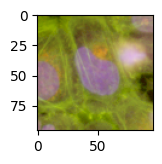

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


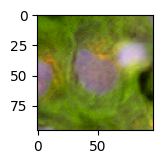

  2%|▏         | 81/4272 [00:25<34:35,  2.02it/s]

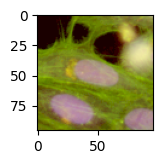

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


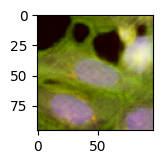

  2%|▏         | 82/4272 [00:25<29:52,  2.34it/s]

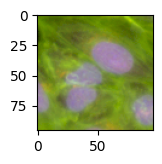

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


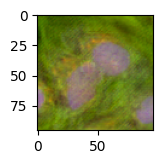

  2%|▏         | 83/4272 [00:25<26:20,  2.65it/s]

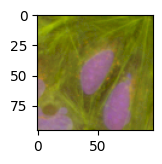

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


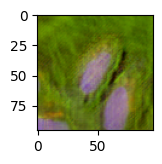

  2%|▏         | 84/4272 [00:25<25:13,  2.77it/s]

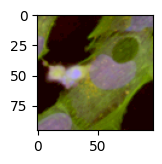

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


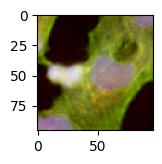

  2%|▏         | 85/4272 [00:26<23:53,  2.92it/s]

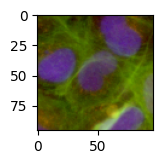

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


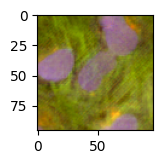

  2%|▏         | 86/4272 [00:26<23:30,  2.97it/s]

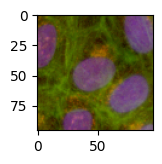

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


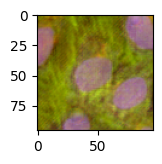

  2%|▏         | 87/4272 [00:26<22:48,  3.06it/s]

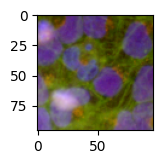

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


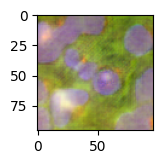

  2%|▏         | 88/4272 [00:27<22:20,  3.12it/s]

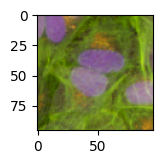

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


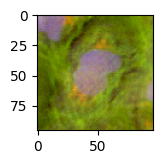

  2%|▏         | 89/4272 [00:27<21:41,  3.21it/s]

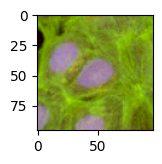

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


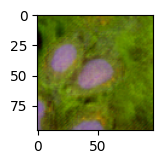

  2%|▏         | 90/4272 [00:27<21:32,  3.24it/s]

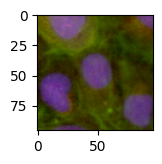

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


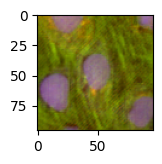

  2%|▏         | 91/4272 [00:28<21:19,  3.27it/s]

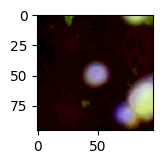

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


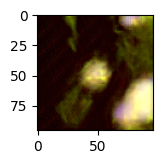

  2%|▏         | 92/4272 [00:28<20:42,  3.37it/s]

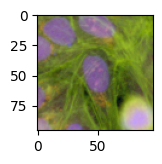

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


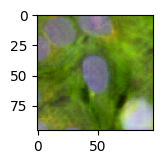

  2%|▏         | 93/4272 [00:28<21:21,  3.26it/s]

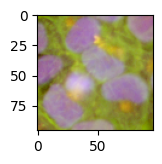

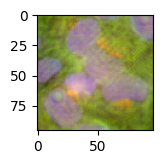

  2%|▏         | 94/4272 [00:28<22:03,  3.16it/s]

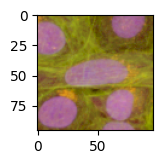

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


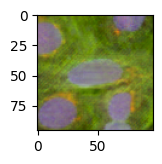

  2%|▏         | 95/4272 [00:29<20:56,  3.32it/s]

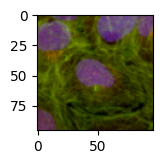

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


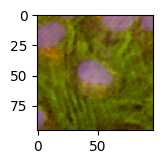

  2%|▏         | 96/4272 [00:29<19:42,  3.53it/s]

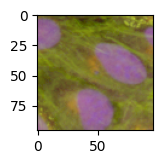

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


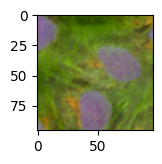

  2%|▏         | 97/4272 [00:29<19:41,  3.53it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


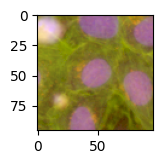

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


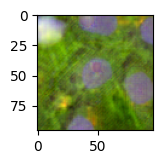

  2%|▏         | 98/4272 [00:30<19:20,  3.60it/s]

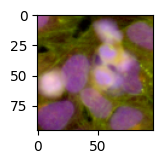

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


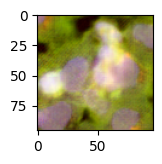

  2%|▏         | 99/4272 [00:30<19:08,  3.63it/s]

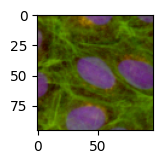

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


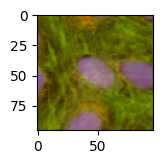

  2%|▏         | 100/4272 [00:30<19:04,  3.65it/s]

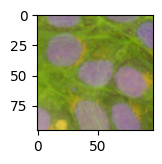

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


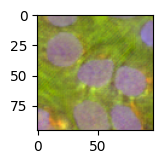

  2%|▏         | 101/4272 [00:30<18:38,  3.73it/s]

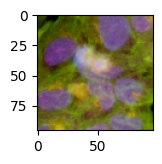

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


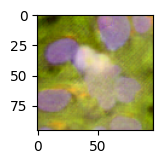

  2%|▏         | 102/4272 [00:31<18:22,  3.78it/s]

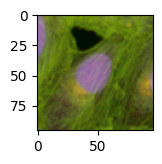

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


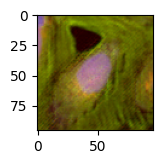

  2%|▏         | 103/4272 [00:31<17:40,  3.93it/s]

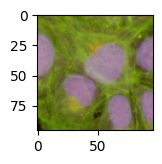

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


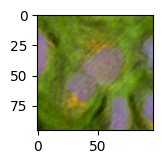

  2%|▏         | 104/4272 [00:31<17:18,  4.01it/s]

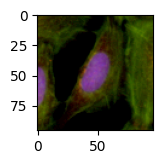

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


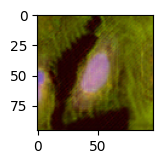

  2%|▏         | 105/4272 [00:31<17:04,  4.07it/s]

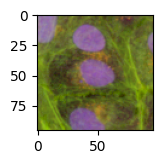

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


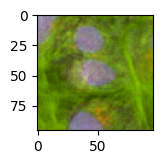

  2%|▏         | 106/4272 [00:32<16:55,  4.10it/s]

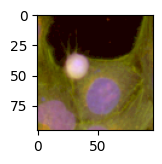

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


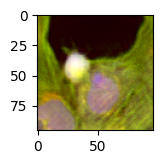

  3%|▎         | 107/4272 [00:32<16:47,  4.13it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


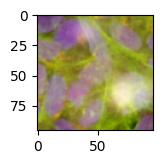

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


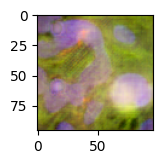

  3%|▎         | 108/4272 [00:32<16:31,  4.20it/s]

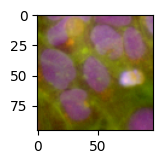

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


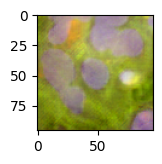

  3%|▎         | 109/4272 [00:32<16:24,  4.23it/s]

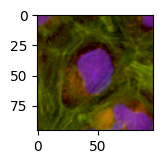

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


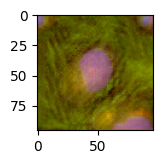

  3%|▎         | 110/4272 [00:32<16:31,  4.20it/s]

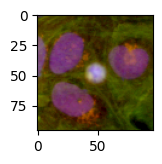

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


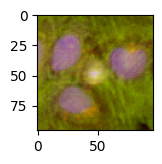

  3%|▎         | 111/4272 [00:33<16:45,  4.14it/s]

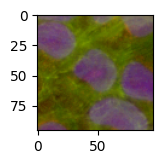

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


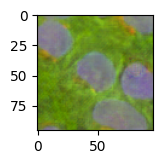

  3%|▎         | 112/4272 [00:33<17:06,  4.05it/s]

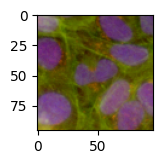

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


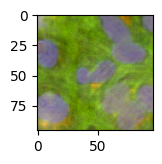

  3%|▎         | 113/4272 [00:33<17:22,  3.99it/s]

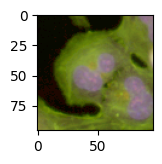

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


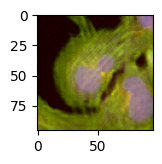

  3%|▎         | 114/4272 [00:33<17:04,  4.06it/s]

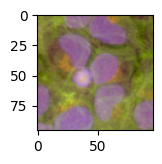

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


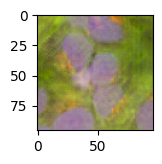

  3%|▎         | 115/4272 [00:34<16:52,  4.10it/s]

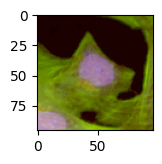

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


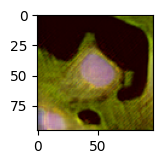

  3%|▎         | 116/4272 [00:34<16:50,  4.11it/s]

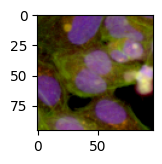

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


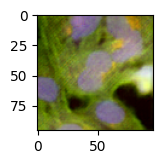

  3%|▎         | 117/4272 [00:34<17:20,  3.99it/s]

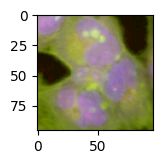

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


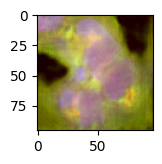

  3%|▎         | 118/4272 [00:34<17:34,  3.94it/s]

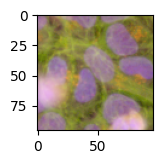

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


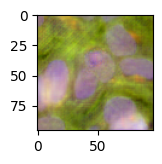

  3%|▎         | 119/4272 [00:35<17:40,  3.92it/s]

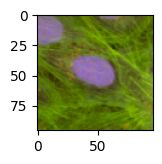

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


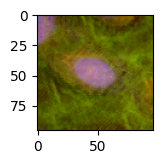

  3%|▎         | 120/4272 [00:35<17:55,  3.86it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


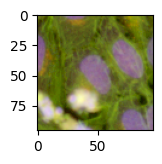

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


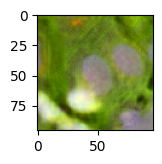

  3%|▎         | 121/4272 [00:35<18:00,  3.84it/s]

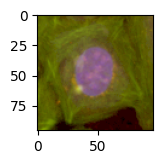

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


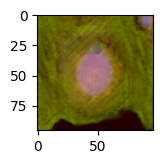

  3%|▎         | 122/4272 [00:35<17:34,  3.94it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


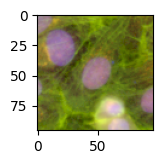

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


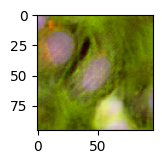

  3%|▎         | 123/4272 [00:36<17:51,  3.87it/s]

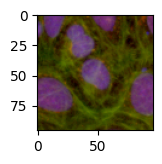

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


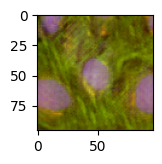

  3%|▎         | 124/4272 [00:36<17:25,  3.97it/s]

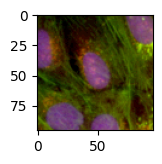

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


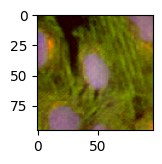

  3%|▎         | 125/4272 [00:36<17:01,  4.06it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


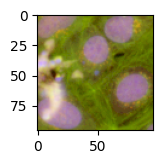

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


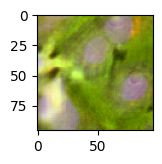

  3%|▎         | 126/4272 [00:36<17:00,  4.06it/s]

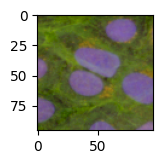

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


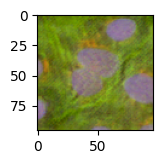

  3%|▎         | 127/4272 [00:37<16:43,  4.13it/s]

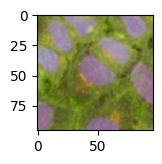

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


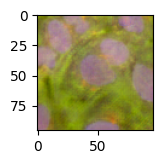

  3%|▎         | 128/4272 [00:37<16:44,  4.13it/s]

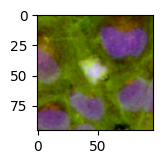

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


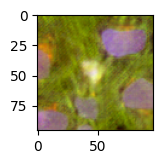

  3%|▎         | 129/4272 [00:37<16:28,  4.19it/s]

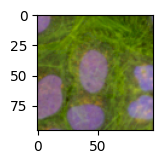

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


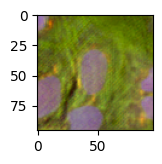

  3%|▎         | 130/4272 [00:37<16:22,  4.22it/s]

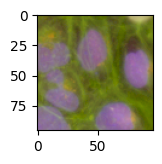

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


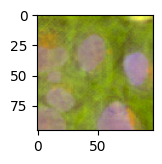

  3%|▎         | 131/4272 [00:38<16:25,  4.20it/s]

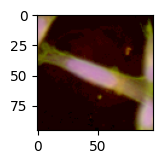

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  3%|▎         | 131/4272 [00:38<20:18,  3.40it/s]


KeyboardInterrupt: 

In [140]:
X_before_transf = []
X_after_transf = []

features = {"batch": [],
            "plate": [],
            "well": [],
            "view": [],
            "no": []}

with torch.no_grad():
    for loader in [train_dataloader, val_dataloader]:
        for batch in tqdm(loader):
            # # Get image 
            X = batch["X"].cuda()
            # Transport everything to a chosen batch, here we pick 0
            y = 0*torch.ones(X.shape[0]).long().cuda()
            y = solver.embedding_matrix(y).cuda()
            y = solver.nets.mapping_network(y)
            # Transport image to new batch
            _, X_generated = solver.nets.generator(X, y)
            for i, filename in enumerate(batch["file_names"]):
                batch, plate, well, view, no = filename.split("-")[1].split("_")
                features["batch"].append(batch)
                features["plate"].append(plate)
                features["well"].append(well)
                features["view"].append(view)
                features["no"].append(no)

            plt.figure(figsize=(1.5,1.5))
            plt.imshow((X[0,[5, 2, 0],:,:].permute(1,2,0).cpu().numpy()+1)/2)
            plt.show()
            plt.figure(figsize=(1.5,1.5))
            plt.imshow((X_generated[0,[5, 2, 0],:,:].permute(1,2,0).cpu().numpy()+1)/2)
            plt.show()

            Z_before_transf = model(X[:, :-1, :, :])
            Z_after_transf = model(X_generated[:, :-1, :, :])
            # Z_before_transf = model(X)
            # Z_after_transf = model(X_generated)

            X_before_transf.append(Z_before_transf.detach().cpu())
            X_after_transf.append(Z_after_transf.detach().cpu())

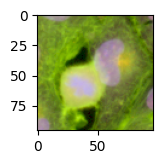

In [137]:
plt.figure(figsize=(1.5,1.5))
plt.imshow((X[0,[5, 2, 0],:,:].permute(1,2,0).cpu().numpy()+1)/2)

In [123]:
X_before_transf = torch.cat(X_before_transf, dim=0)
X_after_transf = torch.cat(X_after_transf, dim=0)

In [124]:
adata_before_transf = sc.AnnData(X=X_before_transf.detach().cpu().numpy(), 
                                 obs= pd.DataFrame(features))
adata_after_transf = sc.AnnData(X=X_after_transf.detach().cpu().numpy(), 
                                 obs= pd.DataFrame(features))

/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Before correction

In [49]:
sc.tl.pca(adata_before_transf)
sc.pp.neighbors(adata_before_transf)
sc.tl.umap(adata_before_transf)

/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/an

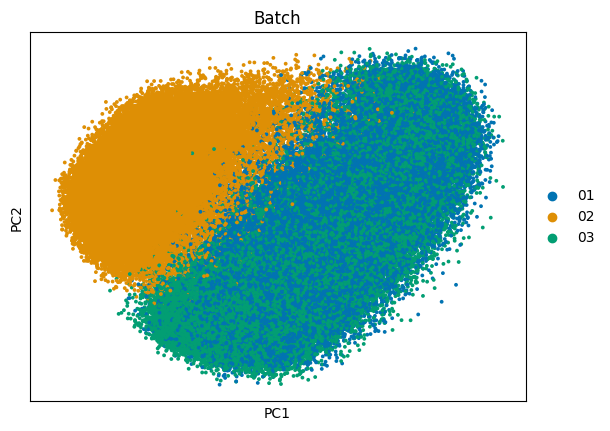

/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/an

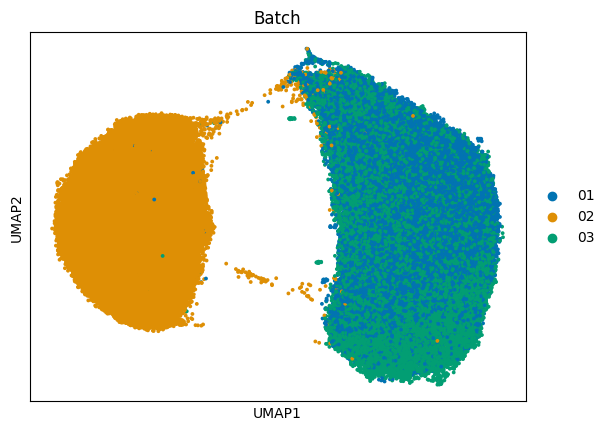

In [50]:
pca_umap_plot_with_preprocessing(adata_before_transf, "Batch", "batch")

After correction

In [125]:
sc.tl.pca(adata_after_transf)
sc.pp.neighbors(adata_after_transf)
sc.tl.umap(adata_after_transf)

/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/an

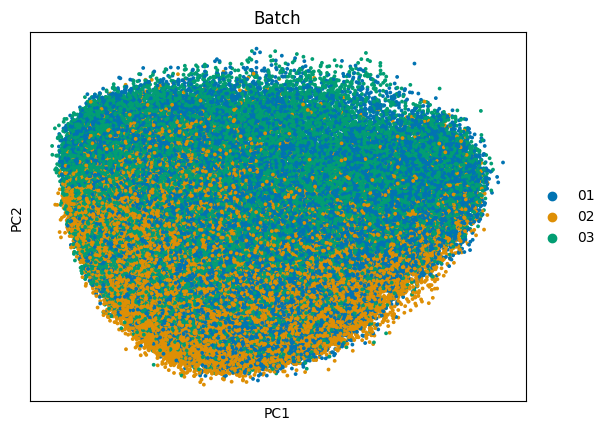

/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/anndata/_core/an

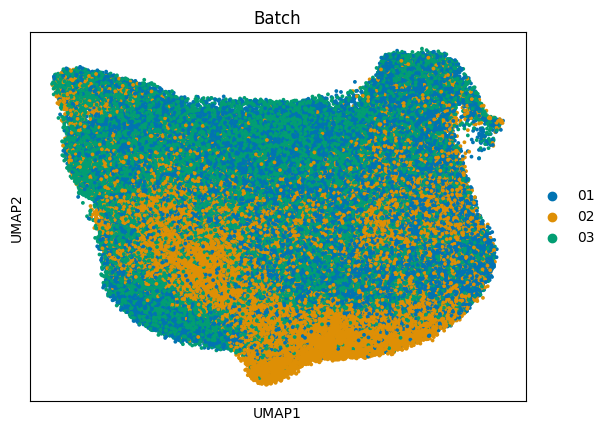

In [127]:
pca_umap_plot_with_preprocessing(adata_after_transf, "Batch", "batch")

/home/icb/alessandro.palma/miniconda3/envs/IMPA_try/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


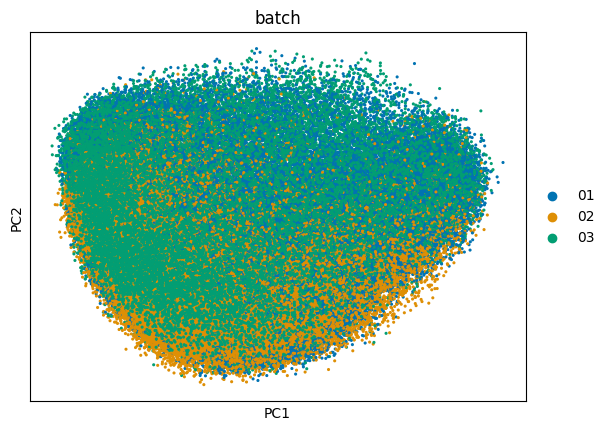

In [131]:
sc.pl.pca(adata_after_transf, color="batch", s=20)

Save results

In [5]:
feature_dest_folder = Path("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/featurized_anndata/rxrx1")

In [6]:
# adata_before_transf.write_h5ad(feature_dest_folder / "rxrx1_adata_before_transf.h5ad")

In [7]:
# adata_after_transf.write_h5ad(feature_dest_folder / "rxrx1_adata_after_transf.h5ad")

In [8]:
adata_before_transf = sc.read_h5ad(feature_dest_folder / "rxrx1_adata_before_transf.h5ad")

In [9]:
adata_after_transf = sc.read_h5ad(feature_dest_folder / "rxrx1_adata_after_transf.h5ad")

## Add compounds to anndata

In [167]:
data_index = pd.read_csv('/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/datasets/rxrx1/metadata/rxrx1_df.csv', index_col=1)
data_index

,Unnamed: 0,BATCH,PLATE,WELL,VIEW,CPD_NAME,ANNOT,CELL_LINE,DOSE,SPLIT
SAMPLE_KEY,,,,,,,,,,
U2OS-01_1_B02_s1_14,0,U2OS-01,1,B02,s1,UNTREATED,negative_control,U2OS,NaN,train
U2OS-01_1_B02_s1_15,1,U2OS-01,1,B02,s1,UNTREATED,negative_control,U2OS,NaN,train
U2OS-01_1_B02_s1_16,2,U2OS-01,1,B02,s1,UNTREATED,negative_control,U2OS,NaN,train
U2OS-01_1_B02_s1_17,3,U2OS-01,1,B02,s1,UNTREATED,negative_control,U2OS,NaN,test
U2OS-01_1_B02_s1_19,4,U2OS-01,1,B02,s1,UNTREATED,negative_control,U2OS,NaN,train
...,...,...,...,...,...,...,...,...,...,...
U2OS-03_3_O23_s2_8,181260,U2OS-03,3,O23,s2,TSFM,treated,U2OS,NaN,train
U2OS-03_3_O23_s2_9,181261,U2OS-03,3,O23,s2,TSFM,treated,U2OS,NaN,test
U2OS-03_3_O23_s2_10,181262,U2OS-03,3,O23,s2,TSFM,treated,U2OS,NaN,train


In [168]:
compound_names = []

for row in adata_before_transf.obs.iterrows():
    batch = row[1].batch
    plate = row[1].plate
    well = row[1].well
    view = row[1]["view"]
    no = row[1].no
    file_name = f"U2OS-{batch}_{plate}_{well}_{view}_{no}"
    cpd = data_index.loc[file_name].CPD_NAME
    compound_names.append(cpd)

In [169]:
adata_before_transf.obs["compound"] = compound_names

In [170]:
adata_after_transf.obs["compound"] = compound_names

## Evaluate scib metrics

In [171]:
# adata_unique = adata_before_transf.copy()

In [172]:
# adata_unique.obsm["Unintegrated"] = adata_before_transf.obsm["X_pca"]

In [173]:
# adata_unique.obsm["IMPA-Integrated"] = adata_after_transf.obsm["X_pca"]

In [174]:
# adata_unique

AnnData object with n_obs × n_vars = 170943 × 384
    obs: 'batch', 'plate', 'well', 'view', 'no', 'compound'
    uns: 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'Unintegrated', 'IMPA-Integrated'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [175]:
from scib_metrics.benchmark import Benchmarker

In [12]:
# bm = Benchmarker(
#     adata_unique,
#     batch_key="batch",
#     label_key="compound",
#     embedding_obsm_keys=["Unintegrated", "IMPA-Integrated"],
#     n_jobs=6,
# )
# bm.benchmark()

In [18]:
# scib_path = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/dino_featurization_project/scib/rxrx1.pkl"

In [19]:
# with open(scib_path, "wb") as file:
#     pkl.dump(bm, file)

In [20]:
with open(scib_path, "rb") as file:
    b = pkl.load(file)

**Plot scib metrics**

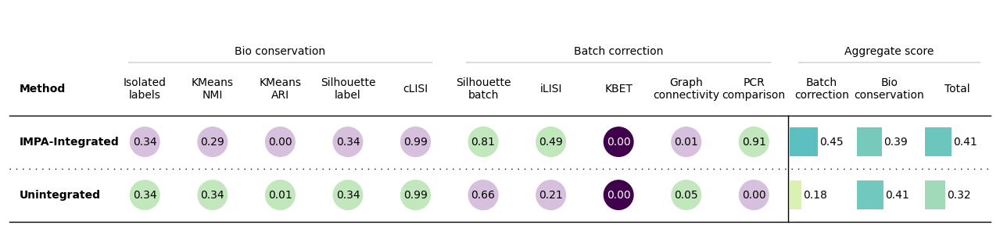

In [21]:
b.plot_results_table(min_max_scale=False)

In [28]:
df = b.get_results(min_max_scale=False)
df

,Isolated labels,KMeans NMI,KMeans ARI,Silhouette label,cLISI,Silhouette batch,iLISI,KBET,Graph connectivity,PCR comparison,Batch correction,Bio conservation,Total
Embedding,,,,,,,,,,,,,
Unintegrated,0.34388,0.344531,0.00691,0.342858,0.990328,0.66195,0.213712,0.0,0.048428,0,0.184818,0.405701,0.317348
IMPA-Integrated,0.339105,0.28832,0.001437,0.338717,0.988953,0.813499,0.488094,0.0,0.014122,0.909972,0.445137,0.391306,0.412839
Metric Type,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Batch correction,Batch correction,Batch correction,Batch correction,Batch correction,Aggregate score,Aggregate score,Aggregate score


In [32]:
df.index

Index(['Unintegrated', 'IMPA-Integrated', 'Metric Type'], dtype='object', name='Embedding')

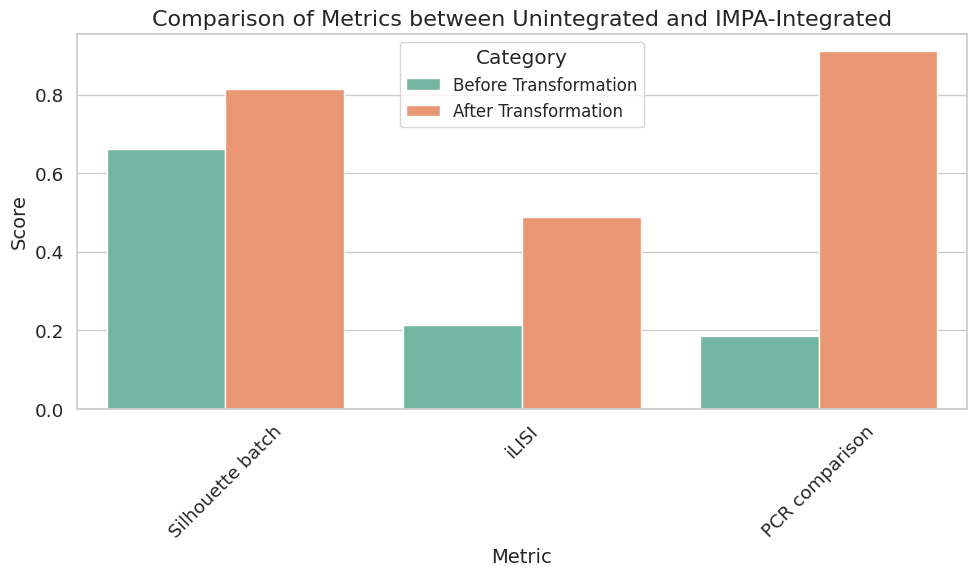

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Data from the table
data = {
    'Category': ['Before Transformation', 
                 'Before Transformation', 
                 'Before Transformation', 
                 'After Transformation', 
                 'After Transformation', 
                 'After Transformation'],
    'Metric': ['Silhouette batch', 'iLISI', 'PCR comparison', 'Silhouette batch', 'iLISI', 'PCR comparison'],
    'Score': [0.66195, 0.213712, 0.184818, 0.813499, 0.488094, 0.909972]
}

# Convert data to DataFrame
df = pd.DataFrame(data)

# Set aesthetic parameters
sns.set(style='whitegrid', font_scale=1.2)

# Plotting with Seaborn
plt.figure(figsize=(10, 6))
palette = sns.color_palette("Set2")  # Choose a suitable color palette
sns.barplot(data=df, x='Metric', y='Score', hue='Category', palette=palette)
plt.title('Comparison of Metrics between Unintegrated and IMPA-Integrated', fontsize=16)
plt.xlabel('Metric', fontsize=14)
plt.ylabel('Score', fontsize=14)
plt.legend(title='Category', fontsize=12)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


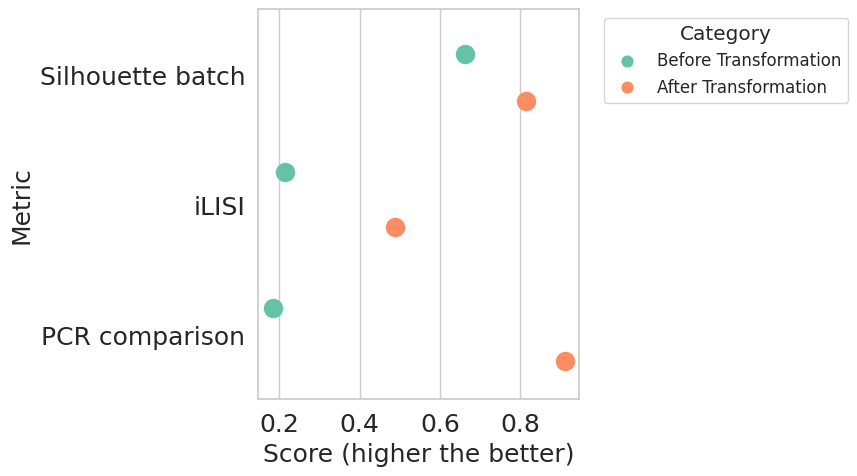

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Data from the table
# Data from the table
data = {
    'Category': ['Before Transformation', 
                 'Before Transformation', 
                 'Before Transformation', 
                 'After Transformation', 
                 'After Transformation', 
                 'After Transformation'],
    'Metric': ['Silhouette batch', 'iLISI', 'PCR comparison', 'Silhouette batch', 'iLISI', 'PCR comparison'],
    'Score': [0.66195, 0.213712, 0.184818, 0.813499, 0.488094, 0.909972]
}

# Convert data to DataFrame
df = pd.DataFrame(data)

# Set aesthetic parameters
sns.set(style='whitegrid', font_scale=1.2)

# Plotting with Seaborn - Horizontal Point plot (Swarm plot)
plt.figure(figsize=(9, 5))
palette = sns.color_palette("Set2")  # Choose a suitable color palette
sns.stripplot(data=df, y='Metric', x='Score', hue='Category', palette=palette, dodge=True, jitter=True, size=14)  # Increase size here
plt.title('', fontsize=16)
plt.xlabel('Score (higher the better)', fontsize=18)
plt.ylabel('Metric', fontsize=18)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Place legend outside the plot
plt.legend(title='Category', fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')


plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

